# **Imports**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
import collections
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report, roc_curve, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from IPython.core.interactiveshell import InteractiveShell
import warnings

#importing packages for modeling
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier, StackingClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import BatchNormalization

%matplotlib inline
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
warnings.filterwarnings('ignore')

In [2]:
target_names=['Non-Persistent', 'Persistent']

# Functions

In [3]:
def evaluation_metrics(y_test, y_pre, target_names):
    #scores
    print("Accuracy :",accuracy_score(y_test,y_pre))
    print("Precision :",precision_score(y_test,y_pre))
    print("Recall :",recall_score(y_test,y_pre))
    print("F1 Score :",f1_score(y_test,y_pre))

    print(classification_report(y_test, y_pre, target_names=target_names))

    #AUC
    fpr, tpr, _ = roc_curve(y_test,  y_pre)
    auc = roc_auc_score(y_test, y_pre)
    print("AUC :", auc)

    #ROC
    plt.plot(fpr,tpr,label="uc={:.3f})".format(auc))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc=4)
    plt.show()

    #CM matrix
    matrix = confusion_matrix(y_test, y_pre)
    cm = pd.DataFrame(matrix, index=target_names, columns=target_names)

    sns.heatmap(cm, annot=True, cbar=None, cmap="Blues", fmt = 'g')
    plt.title("Confusion Matrix"), plt.tight_layout()
    plt.ylabel("True Class"), plt.xlabel("Predicted Class")
    plt.show()

In [4]:
def logistic(X_train,X_test,y_train,y_test):
    model=LogisticRegression()
    model.fit(X_train,y_train)
    y_pre=model.predict(X_test)
    evaluation_metrics(y_test, y_pre, target_names)

In [5]:
def Ridge(X_train,X_test,y_train,y_test):
    #train the model
    model = RidgeClassifier(random_state=2)
    model.fit(X_train, y_train)
    #predictions
    y_pre = model.predict(X_test)
    evaluation_metrics(y_test, y_pre, target_names)
  

In [6]:
def SGD(X_train,X_test,y_train,y_test):
    #train the model
    model = SGDClassifier()
    model.fit(X_train, y_train)
    #predictions
    y_pre = model.predict(X_test)
    evaluation_metrics(y_test, y_pre, target_names)

In [7]:
def XGBOOST(X_train,X_test,y_train,y_test):
  #train the model
  model = XGBClassifier(random_state=2)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [8]:
def RF(X_train,X_test,y_train,y_test):
  #train the model
  model = RandomForestClassifier(random_state=2)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [9]:
def Bagging(X_train,X_test,y_train,y_test):
  #train the model
  model = BaggingClassifier(base_estimator=SVC(), n_estimators=10, random_state=0)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [10]:
def AdaBoost(X_train,X_test,y_train,y_test):
  #train the model
  model = AdaBoostClassifier(n_estimators=100, random_state=0)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [11]:
def ExtraTrees(X_train,X_test,y_train,y_test):
  #train the model
  model = ExtraTreesClassifier(n_estimators=100, random_state=0)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [93]:
def GradientBoosting(X_train,X_test,y_train,y_test):
  #train the model
  model = GradientBoostingClassifier(n_estimators = 600, max_depth = 20, min_samples_split = 4,learning_rate = 0.01, criterion='mse')
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [15]:
def Stacking(X_train,X_test,y_train,y_test):
  #train the model
  estimators = [('rf', RandomForestClassifier(n_estimators=10, random_state=42)), ('svr', make_pipeline(StandardScaler(), LinearSVC(random_state=42)))]
  model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [16]:
def MLP(X_train,X_test,y_train,y_test):
  #train the model
  mlp = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(100,100), random_state=2)
  mlp.fit(X_train, y_train)
  mlp.get_params(deep=True)
  #predictions
  y_pre = mlp.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

In [17]:
def MNN(X_train,X_test,y_train,y_test):
  #train the model
  model = Sequential()
  model.add(Dense(32, input_shape=(X_train.shape[1],), activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(16, activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(8, activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(4, activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(1, activation='sigmoid'))

  opt = tf.keras.optimizers.Adam(learning_rate=0.0001) #optimizer

  model.compile(optimizer=opt, loss=tf.keras.losses.BinaryCrossentropy(), metrics=['accuracy']) #metrics

  earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0, patience=15, verbose=1, mode='auto', baseline=None, restore_best_weights=False)

  history = model.fit(X_train.values, y_train.values, epochs = 150, batch_size=10, validation_split = 0.20, verbose = 1, callbacks = [earlystopper])
  history_dict = history.history

  loss_values = history_dict['loss']
  val_loss_values=history_dict['val_loss']
  plt.plot(loss_values,'b',label='training loss')
  plt.plot(val_loss_values,'r',label='val training loss')
  plt.legend()
  plt.xlabel("Epochs")
  plt.show()  

  accuracy_values = history_dict['accuracy']
  val_accuracy_values=history_dict['val_accuracy']
  plt.plot(val_accuracy_values,'-r',label='val_accuracy')
  plt.plot(accuracy_values,'-b',label='accuracy')
  plt.legend()
  plt.xlabel("Epochs")
  plt.show()

  #predictions
  y_pre = model.predict_classes(X_test)

  evaluation_metrics(y_test, y_pre, target_names)

# Reading data

In [292]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
xls = pd.ExcelFile('dataset/Healthcare_dataset.xlsx')
df= pd.read_excel(xls, 'Dataset')

# **Data Understanding**

In [19]:
df.head()

,Ptid,Persistency_Flag,Gender,Race,Ethnicity,Region,Age_Bucket,Ntm_Speciality,Ntm_Specialist_Flag,Ntm_Speciality_Bucket,Gluco_Record_Prior_Ntm,Gluco_Record_During_Rx,Dexa_Freq_During_Rx,Dexa_During_Rx,Frag_Frac_Prior_Ntm,Frag_Frac_During_Rx,Risk_Segment_Prior_Ntm,Tscore_Bucket_Prior_Ntm,Risk_Segment_During_Rx,Tscore_Bucket_During_Rx,Change_T_Score,Change_Risk_Segment,Adherent_Flag,Idn_Indicator,Injectable_Experience_During_Rx,Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,Comorb_Encounter_For_Immunization,"Comorb_Encntr_For_General_Exam_W_O_Complaint,_Susp_Or_Reprtd_Dx",Comorb_Vitamin_D_Deficiency,Comorb_Other_Joint_Disorder_Not_Elsewhere_Classified,Comorb_Encntr_For_Oth_Sp_Exam_W_O_Complaint_Suspected_Or_Reprtd_Dx,Comorb_Long_Term_Current_Drug_Therapy,Comorb_Dorsalgia,Comorb_Personal_History_Of_Other_Diseases_And_Conditions,Comorb_Other_Disorders_Of_Bone_Density_And_Structure,Comorb_Disorders_of_lipoprotein_metabolism_and_other_lipidemias,Comorb_Osteoporosis_without_current_pathological_fracture,Comorb_Personal_history_of_malignant_neoplasm,Comorb_Gastro_esophageal_reflux_disease,Concom_Cholesterol_And_Triglyceride_Regulating_Preparations,Concom_Narcotics,Concom_Systemic_Corticosteroids_Plain,Concom_Anti_Depressants_And_Mood_Stabilisers,Concom_Fluoroquinolones,Concom_Cephalosporins,Concom_Macrolides_And_Similar_Types,Concom_Broad_Spectrum_Penicillins,Concom_Anaesthetics_General,Concom_Viral_Vaccines,Risk_Type_1_Insulin_Dependent_Diabetes,Risk_Osteogenesis_Imperfecta,Risk_Rheumatoid_Arthritis,Risk_Untreated_Chronic_Hyperthyroidism,Risk_Untreated_Chronic_Hypogonadism,Risk_Untreated_Early_Menopause,Risk_Patient_Parent_Fractured_Their_Hip,Risk_Smoking_Tobacco,Risk_Chronic_Malnutrition_Or_Malabsorption,Risk_Chronic_Liver_Disease,Risk_Family_History_Of_Osteoporosis,Risk_Low_Calcium_Intake,Risk_Vitamin_D_Insufficiency,Risk_Poor_Health_Frailty,Risk_Excessive_Thinness,Risk_Hysterectomy_Oophorectomy,Risk_Estrogen_Deficiency,Risk_Immobilization,Risk_Recurring_Falls,Count_Of_Risks
0,P1,Persistent,Male,Caucasian,Not Hispanic,West,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,0,N,N,N,VLR_LR,>-2.5,VLR_LR,<=-2.5,No change,Unknown,Adherent,N,Y,N,Y,Y,N,N,Y,N,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0
1,P2,Non-Persistent,Male,Asian,Not Hispanic,West,55-65,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,0,N,N,N,VLR_LR,>-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,N,Y,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0
2,P3,Non-Persistent,Female,Other/Unknown,Hispanic,Midwest,65-75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,0,N,N,N,HR_VHR,<=-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,N,Y,Y,N,Y,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,N,N,Y,N,N,N,N,N,N,N,2
3,P4,Non-Persistent,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,Y,0,N,N,N,HR_VHR,>-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,N,Y,N,Y,Y,N,Y,N,N,Y,N,N,Y,N,N,Y,N,Y,Y,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,1
4,P5,Non-Persistent,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,Y,Y,0,N,N,N,HR_VHR,<=-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,N,Y,Y,Y,Y,N,N,N,N,Y,Y,N,N,N,N,N,N,Y,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,1


In [20]:
df.shape

(3424, 69)

In [21]:
df.dtypes

Ptid                                                                  object
Persistency_Flag                                                      object
Gender                                                                object
Race                                                                  object
Ethnicity                                                             object
Region                                                                object
Age_Bucket                                                            object
Ntm_Speciality                                                        object
Ntm_Specialist_Flag                                                   object
Ntm_Speciality_Bucket                                                 object
Gluco_Record_Prior_Ntm                                                object
Gluco_Record_During_Rx                                                object
Dexa_Freq_During_Rx                                                    int64

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3424 entries, 0 to 3423
Data columns (total 69 columns):
 #   Column                                                              Non-Null Count  Dtype 
---  ------                                                              --------------  ----- 
 0   Ptid                                                                3424 non-null   object
 1   Persistency_Flag                                                    3424 non-null   object
 2   Gender                                                              3424 non-null   object
 3   Race                                                                3424 non-null   object
 4   Ethnicity                                                           3424 non-null   object
 5   Region                                                              3424 non-null   object
 6   Age_Bucket                                                          3424 non-null   object
 7   Ntm_Speciality          

In [23]:
df.columns=[x.lower() for x in df.columns]

### **Analyzing dependency of variable (Before Transformation)**

In [24]:
classes=df['persistency_flag'].value_counts()
normal_share=round(classes[0]/df['persistency_flag'].count()*100,2)
fraud_share=round(classes[1]/df['persistency_flag'].count()*100, 2)
print("Non-Persistent : {} %".format(normal_share))
print("Persistent : {} %".format(fraud_share))

Non-Persistent : 62.35 %
Persistent : 37.65 %


In [25]:
cat_corr = df.apply(lambda x : pd.factorize(x)[0]).corr(method='pearson', min_periods=1)[['persistency_flag']]
np.abs(cat_corr).sort_values(by=['persistency_flag'], ascending=False)

,persistency_flag
persistency_flag,1.000000
dexa_during_rx,0.491823
dexa_freq_during_rx,0.395247
comorb_long_term_current_drug_therapy,0.352760
comorb_encounter_for_screening_for_malignant_neoplasms,0.322320
comorb_encounter_for_immunization,0.314887
"comorb_encntr_for_general_exam_w_o_complaint,_susp_or_reprtd_dx",0.289828
comorb_other_disorders_of_bone_density_and_structure,0.247283
concom_systemic_corticosteroids_plain,0.242854
comorb_other_joint_disorder_not_elsewhere_classified,0.233279


## **Missing Values**

In [26]:

df.isnull().sum()

ptid                                                                  0
persistency_flag                                                      0
gender                                                                0
race                                                                  0
ethnicity                                                             0
region                                                                0
age_bucket                                                            0
ntm_speciality                                                        0
ntm_specialist_flag                                                   0
ntm_speciality_bucket                                                 0
gluco_record_prior_ntm                                                0
gluco_record_during_rx                                                0
dexa_freq_during_rx                                                   0
dexa_during_rx                                                  

## **Outlier Analysis**

In [27]:
fig = px.histogram(df, x="dexa_freq_during_rx",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.show()

In [28]:
fig = px.histogram(df, x="count_of_risks",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.show()

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='count_of_risks', ylabel='persistency_flag'>

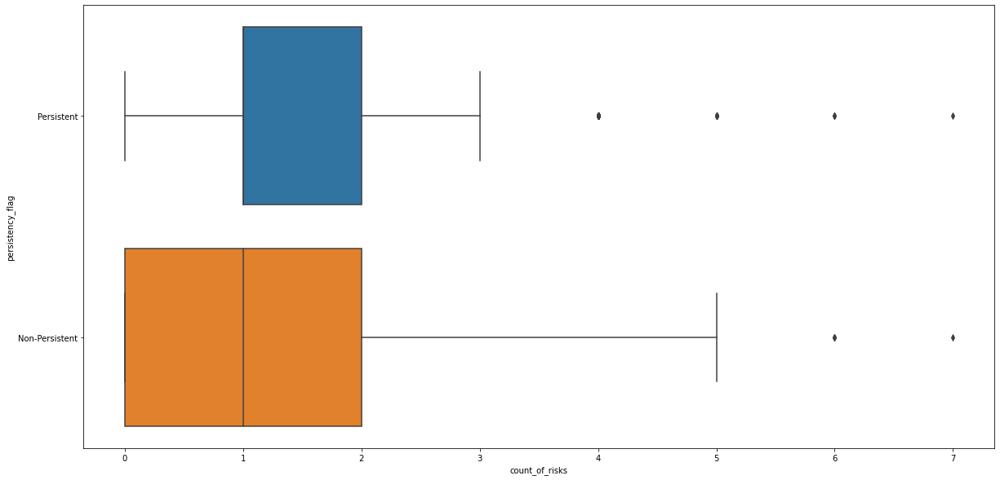

In [29]:
plt.figure(figsize=(20,10))
var ="count_of_risks"
sns.boxplot(x=var,y ="persistency_flag",data=df)

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='dexa_freq_during_rx', ylabel='persistency_flag'>

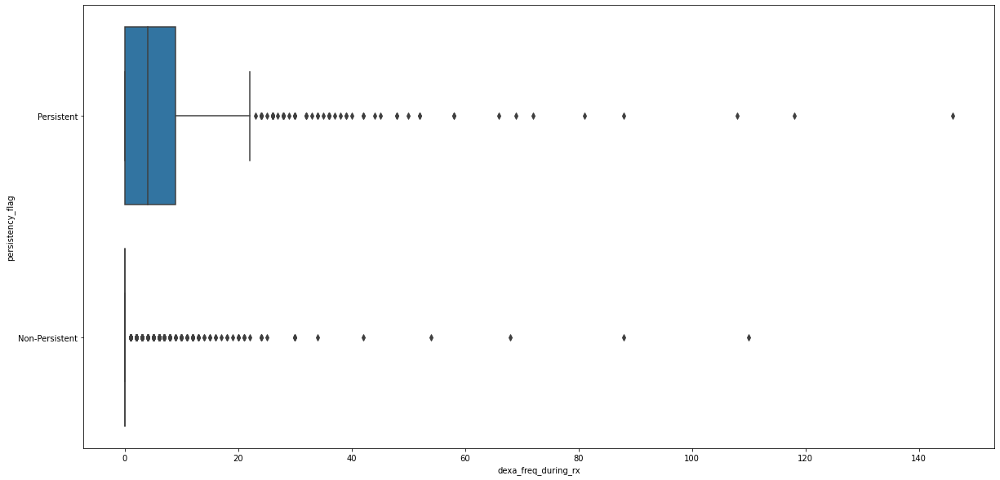

In [30]:
plt.figure(figsize=(20,10))
var ="dexa_freq_during_rx"
sns.boxplot(x=var,y ="persistency_flag",data=df)

In [31]:
print("Count of risks skweness: ",df["count_of_risks"].skew())
print("Count of risks Kurtosis: ",df["count_of_risks"].kurt())

## Data shows a moderate positive skewed data on this column and fairly platykurtic
## Means the data has little outliers

Count of risks skweness:  0.8797905232898707
Count of risks Kurtosis:  0.9004859968892842


In [32]:
print("dexa_freq_during_rx skweness: ",df["dexa_freq_during_rx"].skew())
print("dexa_freq_during_rx Kurtosis: ",df["dexa_freq_during_rx"].kurt())
## very high positive skewed and also with very high kurtosis(Platykurtic)
## This suggests Presence of alot of outliers.

dexa_freq_during_rx skweness:  6.8087302112992285
dexa_freq_during_rx Kurtosis:  74.75837754795428


In [33]:
#standardizing dexa_freq_during_rx df
dexa_scaled = StandardScaler().fit_transform(df['dexa_freq_during_rx'][:,np.newaxis]);
low_range = dexa_scaled[dexa_scaled[:,0].argsort()][:10]
high_range= dexa_scaled[dexa_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]]

outer range (high) of the distribution:
[[ 7.98784109]
 [ 8.11076133]
 [ 8.47952205]
 [ 9.58580421]
 [10.44624589]
 [10.44624589]
 [12.90465068]
 [13.15049116]
 [14.13385307]
 [17.57561978]]


In [34]:
scaler = RobustScaler()
df['dexa_freq_during_rx'] = scaler.fit_transform(df['dexa_freq_during_rx'].values.reshape(-1,1))

In [35]:
scaler = RobustScaler()
df['count_of_risks'] = scaler.fit_transform(df['count_of_risks'].values.reshape(-1,1))

In [36]:
''' Detection '''
# IQR
Q1 = np.percentile(df['dexa_freq_during_rx'], 25, 
                   interpolation = 'midpoint') 
  
Q3 = np.percentile(df['dexa_freq_during_rx'], 75,
                   interpolation = 'midpoint') 
IQR = Q3 - Q1 
  
print("Old Shape: ", df.shape) 
  
# Upper bound
upper = np.where(df['dexa_freq_during_rx'] >= (Q3+1.5*IQR))
# Lower bound
lower = np.where(df['dexa_freq_during_rx'] <= (Q1-1.5*IQR))
  
print("lower",lower[0])
print("Upper",upper[0])

''' Removing the Outliers '''
df.drop(upper[0], inplace = True)
df.drop(lower[0], inplace = True)

print("New Shape: ", df.shape)

df = df.reset_index(drop=True)

' Detection '

Old Shape:  (3424, 69)
lower []
Upper [  32   33   62   65   89  101  110  116  164  180  186  194  198  201
  217  241  246  256  264  282  292  303  327  340  349  358  368  369
  373  378  382  390  415  417  426  433  448  457  462  464  480  495
  496  497  505  514  517  541  545  549  563  575  588  589  592  599
  603  605  613  640  646  651  653  656  657  678  684  688  700  705
  710  711  726  728  729  730  759  760  764  765  785  786  804  814
  823  834  847  849  864  870  873  885  909  915  925  926  930  937
  946  978  982  991  994 1006 1008 1016 1042 1061 1073 1074 1076 1113
 1118 1119 1128 1134 1141 1148 1151 1196 1240 1265 1267 1270 1272 1273
 1280 1283 1286 1291 1315 1359 1360 1363 1365 1370 1372 1396 1398 1404
 1448 1474 1513 1524 1533 1539 1546 1550 1554 1555 1564 1566 1570 1576
 1599 1628 1641 1642 1647 1654 1662 1671 1691 1703 1724 1732 1734 1746
 1752 1773 1782 1783 1788 1793 1803 1815 1826 1833 1834 1836 1838 1848
 1852 1854 1870 1876 1895 1901 1904 190

' Removing the Outliers '

New Shape:  (2964, 69)


In [37]:
''' Detection '''
# IQR
Q1 = np.percentile(df['count_of_risks'], 25, 
                   interpolation = 'midpoint') 
  
Q3 = np.percentile(df['count_of_risks'], 75,
                   interpolation = 'midpoint') 
IQR = Q3 - Q1 
  
print("Old Shape: ", df.shape) 
  
# Upper bound
upper = np.where(df['count_of_risks'] >= (Q3+1.5*IQR))
# Lower bound
lower = np.where(df['count_of_risks'] <= (Q1-1.5*IQR))
  
print("lower",lower[0])
print("Upper",upper[0])

''' Removing the Outliers '''
df.drop(upper[0], inplace = True)
df.drop(lower[0], inplace = True)

print("New Shape: ", df.shape) 

df = df.reset_index(drop=True)

' Detection '

Old Shape:  (2964, 69)
lower []
Upper [ 281  318  327  507  655  665  678  705  733  952 1001 1126 1590 1624
 1836 2227 2234 2450 2611 2702 2755 2888]


' Removing the Outliers '

New Shape:  (2942, 69)


## **Describe Data**

In [38]:
#distribution of categorical features
df.describe(include=['O'])

,ptid,persistency_flag,gender,race,ethnicity,region,age_bucket,ntm_speciality,ntm_specialist_flag,ntm_speciality_bucket,gluco_record_prior_ntm,gluco_record_during_rx,dexa_during_rx,frag_frac_prior_ntm,frag_frac_during_rx,risk_segment_prior_ntm,tscore_bucket_prior_ntm,risk_segment_during_rx,tscore_bucket_during_rx,change_t_score,change_risk_segment,adherent_flag,idn_indicator,injectable_experience_during_rx,comorb_encounter_for_screening_for_malignant_neoplasms,comorb_encounter_for_immunization,"comorb_encntr_for_general_exam_w_o_complaint,_susp_or_reprtd_dx",comorb_vitamin_d_deficiency,comorb_other_joint_disorder_not_elsewhere_classified,comorb_encntr_for_oth_sp_exam_w_o_complaint_suspected_or_reprtd_dx,comorb_long_term_current_drug_therapy,comorb_dorsalgia,comorb_personal_history_of_other_diseases_and_conditions,comorb_other_disorders_of_bone_density_and_structure,comorb_disorders_of_lipoprotein_metabolism_and_other_lipidemias,comorb_osteoporosis_without_current_pathological_fracture,comorb_personal_history_of_malignant_neoplasm,comorb_gastro_esophageal_reflux_disease,concom_cholesterol_and_triglyceride_regulating_preparations,concom_narcotics,concom_systemic_corticosteroids_plain,concom_anti_depressants_and_mood_stabilisers,concom_fluoroquinolones,concom_cephalosporins,concom_macrolides_and_similar_types,concom_broad_spectrum_penicillins,concom_anaesthetics_general,concom_viral_vaccines,risk_type_1_insulin_dependent_diabetes,risk_osteogenesis_imperfecta,risk_rheumatoid_arthritis,risk_untreated_chronic_hyperthyroidism,risk_untreated_chronic_hypogonadism,risk_untreated_early_menopause,risk_patient_parent_fractured_their_hip,risk_smoking_tobacco,risk_chronic_malnutrition_or_malabsorption,risk_chronic_liver_disease,risk_family_history_of_osteoporosis,risk_low_calcium_intake,risk_vitamin_d_insufficiency,risk_poor_health_frailty,risk_excessive_thinness,risk_hysterectomy_oophorectomy,risk_estrogen_deficiency,risk_immobilization,risk_recurring_falls
count,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942
unique,2942,2,2,4,3,5,4,35,2,3,2,2,2,2,2,2,2,3,3,4,4,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
top,P2981,Non-Persistent,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,N,N,N,VLR_LR,>-2.5,Unknown,Unknown,No change,Unknown,Adherent,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N
freq,1,2047,2769,2701,2784,1210,1262,1345,1774,1855,2241,2205,2474,2496,2613,1676,1690,1362,1362,1387,1969,2807,2199,2615,1765,1771,1891,2055,2146,2367,2324,2352,2438,2554,1485,2205,2434,2457,1953,1939,2143,2144,2432,2472,2514,2600,2559,2665,2824,2939,2834,2940,2849,2931,2741,2390,2565,2928,2650,2906,1558,2788,2881,2897,2933,2930,2887


In [39]:
df.groupby(['persistency_flag']).mean().T

persistency_flag,Non-Persistent,Persistent
dexa_freq_during_rx,0.085491,0.662570
count_of_risks,0.074744,0.155866


In [40]:
df.groupby(['gender']).mean().T

gender,Female,Male
dexa_freq_during_rx,0.263874,0.215800
count_of_risks,0.099494,0.098266


In [41]:
df.groupby(['race']).mean()

,dexa_freq_during_rx,count_of_risks
race,,
African American,0.246377,0.168478
Asian,0.135266,0.021739
Caucasian,0.266445,0.098297
Other/Unknown,0.204167,0.125000


In [42]:
df.groupby(['ethnicity']).mean().T

ethnicity,Hispanic,Not Hispanic,Unknown
dexa_freq_during_rx,0.279835,0.260417,0.264069
count_of_risks,0.265432,0.097342,0.000000


In [43]:
df.groupby(['age_bucket']).mean().T

age_bucket,55-65,65-75,<55,>75
dexa_freq_during_rx,0.242229,0.297880,0.273973,0.242208
count_of_risks,0.118167,0.097039,0.089041,0.093106


In [44]:
df.groupby(['ntm_speciality']).mean().T

ntm_speciality,CARDIOLOGY,CLINICAL NURSE SPECIALIST,EMERGENCY MEDICINE,ENDOCRINOLOGY,GASTROENTEROLOGY,GENERAL PRACTITIONER,GERIATRIC MEDICINE,HEMATOLOGY & ONCOLOGY,HOSPICE AND PALLIATIVE MEDICINE,HOSPITAL MEDICINE,NEPHROLOGY,NUCLEAR MEDICINE,OBSTETRICS & OBSTETRICS & GYNECOLOGY & OBSTETRICS & GYNECOLOGY,OBSTETRICS AND GYNECOLOGY,OCCUPATIONAL MEDICINE,ONCOLOGY,OPHTHALMOLOGY,ORTHOPEDIC SURGERY,ORTHOPEDICS,OTOLARYNGOLOGY,PAIN MEDICINE,PATHOLOGY,PEDIATRICS,PHYSICAL MEDICINE AND REHABILITATION,PLASTIC SURGERY,PODIATRY,PSYCHIATRY AND NEUROLOGY,PULMONARY MEDICINE,RADIOLOGY,RHEUMATOLOGY,SURGERY AND SURGICAL SPECIALTIES,TRANSPLANT SURGERY,UROLOGY,Unknown,VASCULAR SURGERY
dexa_freq_during_rx,0.285714,0.0,0.0,0.392265,0.0,0.212887,1.00,0.111111,0.00,0.0,0.0,0.0,0.0,0.220833,0.0,0.586453,0.0,0.173333,0.00,0.358974,0.666667,0.794872,0.037037,0.000000,0.0,0.0,0.666667,0.428571,0.0,0.221349,0.2500,0.0,0.149425,0.207303,0.0
count_of_risks,0.380952,-0.5,0.0,0.279006,0.0,0.049442,0.75,-0.041667,-0.25,-0.5,0.0,1.0,-0.5,0.000000,0.0,-0.008021,-0.5,0.200000,-0.25,-0.230769,1.000000,0.307692,0.111111,0.045455,-0.5,-0.5,0.500000,0.714286,0.0,0.185658,0.1875,-0.5,-0.034483,0.042403,0.0


In [45]:
df.groupby(['ntm_specialist_flag']).mean().T

ntm_specialist_flag,Others,Specialist
dexa_freq_during_rx,0.215145,0.330765
count_of_risks,0.056370,0.164812


In [46]:
df.groupby(['ntm_speciality_bucket']).mean().T

ntm_speciality_bucket,Endo/Onc/Uro,OB/GYN/Others/PCP/Unknown,Rheum
dexa_freq_during_rx,0.442907,0.215274,0.221349
count_of_risks,0.170415,0.053639,0.185658


In [47]:
df.groupby(['ntm_speciality_bucket']).mean().T

ntm_speciality_bucket,Endo/Onc/Uro,OB/GYN/Others/PCP/Unknown,Rheum
dexa_freq_during_rx,0.442907,0.215274,0.221349
count_of_risks,0.170415,0.053639,0.185658


In [48]:
df.groupby(['risk_chronic_liver_disease']).mean().T

risk_chronic_liver_disease,N,Y
dexa_freq_during_rx,0.260132,0.452381
count_of_risks,0.096482,0.714286


In [49]:
df.groupby(['risk_family_history_of_osteoporosis']).mean().T

risk_family_history_of_osteoporosis,N,Y
dexa_freq_during_rx,0.258113,0.287671
count_of_risks,0.045283,0.590753


In [50]:
df.groupby(['risk_low_calcium_intake']).mean().T

risk_low_calcium_intake,N,Y
dexa_freq_during_rx,0.261069,0.259259
count_of_risks,0.090502,0.819444


In [51]:
df.groupby(['risk_vitamin_d_insufficiency']).mean().T

risk_vitamin_d_insufficiency,N,Y
dexa_freq_during_rx,0.223363,0.303468
count_of_risks,-0.175866,0.409321


In [52]:
df.groupby(['risk_excessive_thinness']).mean().T

risk_excessive_thinness,N,Y
dexa_freq_during_rx,0.261946,0.218579
count_of_risks,0.085908,0.737705


In [53]:
df.groupby(['risk_hysterectomy_oophorectomy']).mean().T

risk_hysterectomy_oophorectomy,N,Y
dexa_freq_during_rx,0.261650,0.222222
count_of_risks,0.089748,0.722222


In [54]:
df.groupby(['risk_estrogen_deficiency']).mean().T

risk_estrogen_deficiency,N,Y
dexa_freq_during_rx,0.261052,0.259259
count_of_risks,0.097682,0.666667


In [55]:
df.groupby(['risk_immobilization']).mean().T

risk_immobilization,N,Y
dexa_freq_during_rx,0.262002,0.027778
count_of_risks,0.096416,0.833333


In [56]:

df.groupby(['risk_recurring_falls']).mean().T

risk_recurring_falls,N,Y
dexa_freq_during_rx,0.259901,0.321212
count_of_risks,0.087634,0.718182


# **Data Wrangling , Transformation and Standardization**

In [57]:
df = df.drop(['ptid'], axis=1)

In [58]:
mapper = {'N': 0, 'Y':1}
df = df.replace(mapper)

In [59]:
df['persistency_flag'] = df['persistency_flag'].replace(['Non-Persistent', 'Persistent'],[0, 1])
df.head()

,persistency_flag,gender,race,ethnicity,region,age_bucket,ntm_speciality,ntm_specialist_flag,ntm_speciality_bucket,gluco_record_prior_ntm,gluco_record_during_rx,dexa_freq_during_rx,dexa_during_rx,frag_frac_prior_ntm,frag_frac_during_rx,risk_segment_prior_ntm,tscore_bucket_prior_ntm,risk_segment_during_rx,tscore_bucket_during_rx,change_t_score,change_risk_segment,adherent_flag,idn_indicator,injectable_experience_during_rx,comorb_encounter_for_screening_for_malignant_neoplasms,comorb_encounter_for_immunization,"comorb_encntr_for_general_exam_w_o_complaint,_susp_or_reprtd_dx",comorb_vitamin_d_deficiency,comorb_other_joint_disorder_not_elsewhere_classified,comorb_encntr_for_oth_sp_exam_w_o_complaint_suspected_or_reprtd_dx,comorb_long_term_current_drug_therapy,comorb_dorsalgia,comorb_personal_history_of_other_diseases_and_conditions,comorb_other_disorders_of_bone_density_and_structure,comorb_disorders_of_lipoprotein_metabolism_and_other_lipidemias,comorb_osteoporosis_without_current_pathological_fracture,comorb_personal_history_of_malignant_neoplasm,comorb_gastro_esophageal_reflux_disease,concom_cholesterol_and_triglyceride_regulating_preparations,concom_narcotics,concom_systemic_corticosteroids_plain,concom_anti_depressants_and_mood_stabilisers,concom_fluoroquinolones,concom_cephalosporins,concom_macrolides_and_similar_types,concom_broad_spectrum_penicillins,concom_anaesthetics_general,concom_viral_vaccines,risk_type_1_insulin_dependent_diabetes,risk_osteogenesis_imperfecta,risk_rheumatoid_arthritis,risk_untreated_chronic_hyperthyroidism,risk_untreated_chronic_hypogonadism,risk_untreated_early_menopause,risk_patient_parent_fractured_their_hip,risk_smoking_tobacco,risk_chronic_malnutrition_or_malabsorption,risk_chronic_liver_disease,risk_family_history_of_osteoporosis,risk_low_calcium_intake,risk_vitamin_d_insufficiency,risk_poor_health_frailty,risk_excessive_thinness,risk_hysterectomy_oophorectomy,risk_estrogen_deficiency,risk_immobilization,risk_recurring_falls,count_of_risks
0,1,Male,Caucasian,Not Hispanic,West,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,0,0.0,0,0,0,VLR_LR,>-2.5,VLR_LR,<=-2.5,No change,Unknown,Adherent,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.5
1,0,Male,Asian,Not Hispanic,West,55-65,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,0,0.0,0,0,0,VLR_LR,>-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.5
2,0,Female,Other/Unknown,Hispanic,Midwest,65-75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,0,0.0,0,0,0,HR_VHR,<=-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0.5
3,0,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,1,0.0,0,0,0,HR_VHR,>-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0
4,0,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,1,1,0.0,0,0,0,HR_VHR,<=-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0


### **Analyzing dependency of variable (After Transformation)**

In [60]:
np.abs(df.corr()).sort_values(by=['persistency_flag'], ascending=False)

,persistency_flag,gluco_record_prior_ntm,gluco_record_during_rx,dexa_freq_during_rx,dexa_during_rx,frag_frac_prior_ntm,frag_frac_during_rx,idn_indicator,injectable_experience_during_rx,comorb_encounter_for_screening_for_malignant_neoplasms,comorb_encounter_for_immunization,"comorb_encntr_for_general_exam_w_o_complaint,_susp_or_reprtd_dx",comorb_vitamin_d_deficiency,comorb_other_joint_disorder_not_elsewhere_classified,comorb_encntr_for_oth_sp_exam_w_o_complaint_suspected_or_reprtd_dx,comorb_long_term_current_drug_therapy,comorb_dorsalgia,comorb_personal_history_of_other_diseases_and_conditions,comorb_other_disorders_of_bone_density_and_structure,comorb_disorders_of_lipoprotein_metabolism_and_other_lipidemias,comorb_osteoporosis_without_current_pathological_fracture,comorb_personal_history_of_malignant_neoplasm,comorb_gastro_esophageal_reflux_disease,concom_cholesterol_and_triglyceride_regulating_preparations,concom_narcotics,concom_systemic_corticosteroids_plain,concom_anti_depressants_and_mood_stabilisers,concom_fluoroquinolones,concom_cephalosporins,concom_macrolides_and_similar_types,concom_broad_spectrum_penicillins,concom_anaesthetics_general,concom_viral_vaccines,risk_type_1_insulin_dependent_diabetes,risk_osteogenesis_imperfecta,risk_rheumatoid_arthritis,risk_untreated_chronic_hyperthyroidism,risk_untreated_chronic_hypogonadism,risk_untreated_early_menopause,risk_patient_parent_fractured_their_hip,risk_smoking_tobacco,risk_chronic_malnutrition_or_malabsorption,risk_chronic_liver_disease,risk_family_history_of_osteoporosis,risk_low_calcium_intake,risk_vitamin_d_insufficiency,risk_poor_health_frailty,risk_excessive_thinness,risk_hysterectomy_oophorectomy,risk_estrogen_deficiency,risk_immobilization,risk_recurring_falls,count_of_risks
persistency_flag,1.000000,0.003027,0.212778,0.414876,0.374966,0.005521,0.102944,0.125887,0.097495,0.268339,0.268305,0.257895,0.151592,0.215937,0.164096,0.342776,0.179925,0.189565,0.227003,0.147411,0.132641,0.157273,0.207985,0.125322,0.188391,0.249048,0.111728,0.181213,0.217821,0.192350,0.186610,0.220619,0.227004,0.007144,0.002022,0.059501,0.017246,0.045216,0.004193,0.015073,0.115573,0.031632,0.029426,0.016878,0.013116,0.069520,0.055891,0.023628,0.016192,0.023250,0.042316,0.020356,0.071565
dexa_freq_during_rx,0.414876,0.004579,0.113110,1.000000,0.937887,0.026026,0.074350,0.069223,0.047364,0.189816,0.139956,0.147761,0.112020,0.131364,0.099428,0.227321,0.100791,0.094119,0.241814,0.101263,0.175626,0.105473,0.111739,0.072511,0.134652,0.132662,0.068515,0.109254,0.108692,0.102847,0.101176,0.172603,0.101285,0.018578,0.013033,0.010902,0.010639,0.016361,0.015623,0.001692,0.067436,0.027944,0.020674,0.013810,0.000311,0.062477,0.013199,0.009656,0.007561,0.000155,0.023328,0.012977,0.068723
dexa_during_rx,0.374966,0.007609,0.104582,0.937887,1.000000,0.026049,0.069782,0.062444,0.044403,0.175978,0.117186,0.141213,0.092953,0.126303,0.094991,0.200062,0.088536,0.083433,0.234226,0.091502,0.181794,0.098819,0.102311,0.070182,0.130274,0.120977,0.073281,0.102795,0.102058,0.086760,0.100311,0.160387,0.085717,0.020031,0.013896,0.005832,0.011344,0.011717,0.019036,0.003588,0.067105,0.027883,0.023942,0.017250,0.010763,0.053698,0.022940,0.004589,0.016344,0.009564,0.013253,0.022306,0.066772
comorb_long_term_current_drug_therapy,0.342776,0.095477,0.198705,0.227321,0.200062,0.047262,0.116206,0.103854,0.094747,0.132439,0.196069,0.113580,0.104871,0.198705,0.114082,1.000000,0.206443,0.228391,0.218237,0.136753,0.154413,0.161799,0.231900,0.152348,0.276913,0.232933,0.094536,0.158418,0.230645,0.149318,0.143598,0.261722,0.213756,0.111473,0.009668,0.156696,0.013450,0.011753,0.031591,0.012494,0.130473,0.054439,0.000717,0.028850,0.027036,0.079034,0.036156,0.012803,0.023476,0.013456,0.019909,0.052037,0.156891
comorb_encounter_for_screening_for_malignant_neoplasms,0.268339,0.023529,0.077097,0.189816,0.175978,0.025982,0.011839,0.061082,0.056999,1.000000,0.187835,0.261385,0.062198,0.105490,0.250130,0.132439,0.109094,0.112999,0.132817,0.144459

(<Figure size 1080x720 with 1 Axes>, <AxesSubplot:>)

<AxesSubplot:>

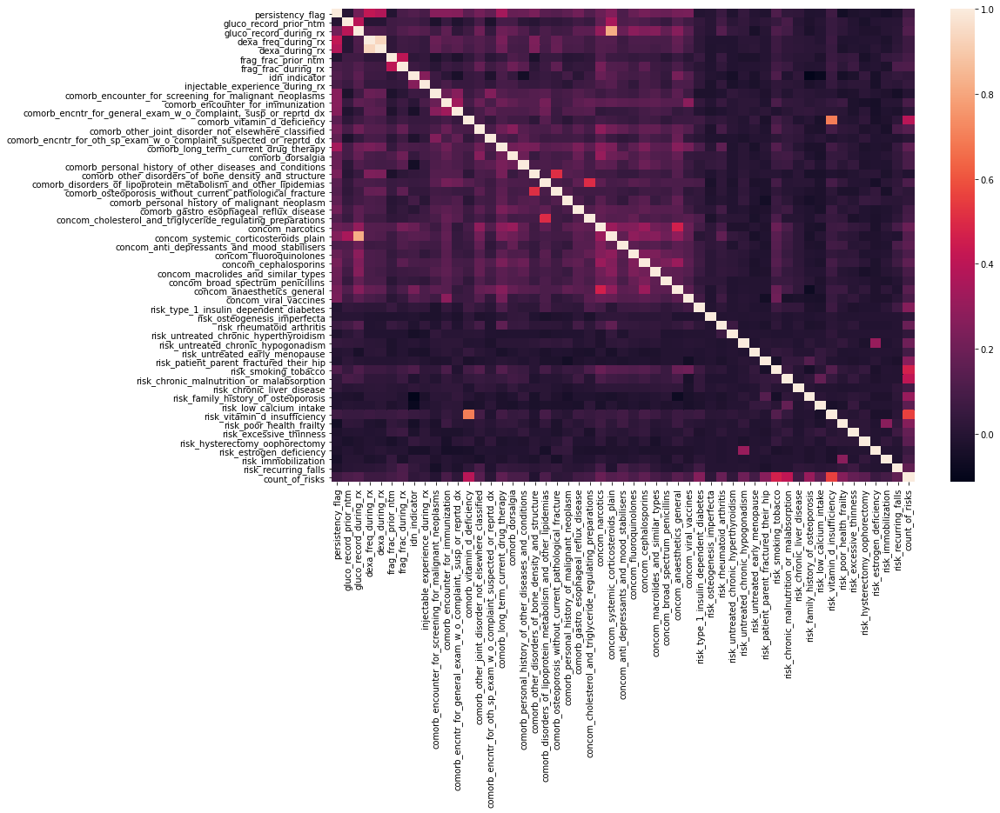

In [61]:
plt.subplots(figsize=(15,10))
sns.heatmap(df.corr())

### *Creating Dummy values*

In [73]:
X=df.drop(['persistency_flag'],axis=1)
y=df['persistency_flag']

X = pd.get_dummies(X)
X.columns=[x.lower() for x in X.columns]
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.3, stratify=y)

In [74]:
df_train = X_train.copy()
df_train['persistency_flag'] = y_train
df_train.head()

,gluco_record_prior_ntm,gluco_record_during_rx,dexa_freq_during_rx,dexa_during_rx,frag_frac_prior_ntm,frag_frac_during_rx,idn_indicator,injectable_experience_during_rx,comorb_encounter_for_screening_for_malignant_neoplasms,comorb_encounter_for_immunization,"comorb_encntr_for_general_exam_w_o_complaint,_susp_or_reprtd_dx",comorb_vitamin_d_deficiency,comorb_other_joint_disorder_not_elsewhere_classified,comorb_encntr_for_oth_sp_exam_w_o_complaint_suspected_or_reprtd_dx,comorb_long_term_current_drug_therapy,comorb_dorsalgia,comorb_personal_history_of_other_diseases_and_conditions,comorb_other_disorders_of_bone_density_and_structure,comorb_disorders_of_lipoprotein_metabolism_and_other_lipidemias,comorb_osteoporosis_without_current_pathological_fracture,comorb_personal_history_of_malignant_neoplasm,comorb_gastro_esophageal_reflux_disease,concom_cholesterol_and_triglyceride_regulating_preparations,concom_narcotics,concom_systemic_corticosteroids_plain,concom_anti_depressants_and_mood_stabilisers,concom_fluoroquinolones,concom_cephalosporins,concom_macrolides_and_similar_types,concom_broad_spectrum_penicillins,concom_anaesthetics_general,concom_viral_vaccines,risk_type_1_insulin_dependent_diabetes,risk_osteogenesis_imperfecta,risk_rheumatoid_arthritis,risk_untreated_chronic_hyperthyroidism,risk_untreated_chronic_hypogonadism,risk_untreated_early_menopause,risk_patient_parent_fractured_their_hip,risk_smoking_tobacco,risk_chronic_malnutrition_or_malabsorption,risk_chronic_liver_disease,risk_family_history_of_osteoporosis,risk_low_calcium_intake,risk_vitamin_d_insufficiency,risk_poor_health_frailty,risk_excessive_thinness,risk_hysterectomy_oophorectomy,risk_estrogen_deficiency,risk_immobilization,risk_recurring_falls,count_of_risks,gender_female,gender_male,race_african american,race_asian,race_caucasian,race_other/unknown,ethnicity_hispanic,ethnicity_not hispanic,ethnicity_unknown,region_midwest,region_northeast,region_other/unknown,region_south,region_west,age_bucket_55-65,age_bucket_65-75,age_bucket_<55,age_bucket_>75,ntm_speciality_cardiology,ntm_speciality_clinical nurse specialist,ntm_speciality_emergency medicine,ntm_speciality_endocrinology,ntm_speciality_gastroenterology,ntm_speciality_general practitioner,ntm_speciality_geriatric medicine,ntm_speciality_hematology & oncology,ntm_speciality_hospice and palliative medicine,ntm_speciality_hospital medicine,ntm_speciality_nephrology,ntm_speciality_nuclear medicine,ntm_speciality_obstetrics & obstetrics & gynecology & obstetrics & gynecology,ntm_speciality_obstetrics and gynecology,ntm_speciality_occupational medicine,ntm_speciality_oncology,ntm_speciality_ophthalmology,ntm_speciality_orthopedic surgery,ntm_speciality_orthopedics,ntm_speciality_otolaryngology,ntm_speciality_pain medicine,ntm_speciality_pathology,ntm_speciality_pediatrics,ntm_speciality_physical medicine and rehabilitation,ntm_speciality_plastic surgery,ntm_speciality_podiatry,ntm_speciality_psychiatry and neurology,ntm_speciality_pulmonary medicine,ntm_speciality_radiology,ntm_speciality_rheumatology,ntm_speciality_surgery and surgical specialties,ntm_speciality_transplant surgery,ntm_speciality_urology,ntm_speciality_unknown,ntm_speciality_vascular surgery,ntm_specialist_flag_others,ntm_specialist_flag_specialist,ntm_speciality_bucket_endo/onc/uro,ntm_speciality_bucket_ob/gyn/others/pcp/unknown,ntm_speciality_bucket_rheum,risk_segment_prior_ntm_hr_vhr,risk_segment_prior_ntm_vlr_lr,tscore_bucket_prior_ntm_<=-2.5,tscore_bucket_prior_ntm_>-2.5,risk_segment_during_rx_hr_vhr,risk_segment_during_rx_unknown,risk_segment_during_rx_vlr_lr,tscore_bucket_during_rx_<=-2.5,tscore_bucket_during_rx_>-2.5,tscore_bucket_during_rx_unknown,change_t_score_improved,change_t_score_no change,change_t_score_unknown,change_t_score_worsened,change_risk_segment_improved,change_risk_segment_no change,change_risk_segment_unknown,change_risk_segment_worsened,adherent_flag_adherent,adherent_flag_non-adherent,persistency_flag
1493,1,1,0.0,0,0,0,0

### *Come Imbalanced dataset*

In [75]:
classes=df_train['persistency_flag'].value_counts()
normal_share=round(classes[0]/df_train['persistency_flag'].count()*100,2)
fraud_share=round(classes[1]/df_train['persistency_flag'].count()*100, 2)
print("Non-Persistent : {} %".format(normal_share))
print("Persistent : {} %".format(fraud_share))

Non-Persistent : 69.6 %
Persistent : 30.4 %


In [76]:
fig = px.histogram(df_train, x="persistency_flag", color="persistency_flag", title="Persistent class histogram")
fig.show()

### *Upsampling*

In [77]:
# Upsampling
df_minority_upsampled = resample(df_train[df_train['persistency_flag'] == 1], 
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_train[df_train['persistency_flag'] == 0]),    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_train = pd.concat([df_train[df_train['persistency_flag'] == 0], df_minority_upsampled])
 
# Display new class counts
df_train.persistency_flag.value_counts()

0    1433
1    1433
Name: persistency_flag, dtype: int64

In [78]:
X_train=df_train.drop(['persistency_flag'],axis=1)
y_train=df_train['persistency_flag']

In [79]:
fig = px.histogram(df_train, x="persistency_flag", color="persistency_flag", title="Persistent class histogram")
fig.show()

# **Model Creation**

## **Linear Models**

### LogisticRegression

Accuracy : 0.7802944507361268
Precision : 0.6262626262626263
Recall : 0.6914498141263941
F1 Score : 0.657243816254417
                precision    recall  f1-score   support

Non-Persistent       0.86      0.82      0.84       614
    Persistent       0.63      0.69      0.66       269

      accuracy                           0.78       883
     macro avg       0.74      0.76      0.75       883
  weighted avg       0.79      0.78      0.78       883

AUC : 0.7553340275843696


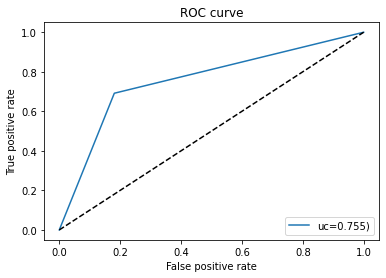

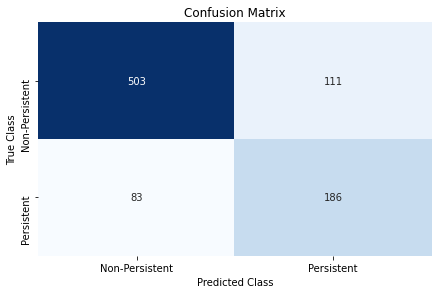

In [80]:
logistic(X_train,X_test,y_train,y_test)

### RidgeClassifier

Accuracy : 0.7780294450736127
Precision : 0.6327272727272727
Recall : 0.6468401486988847
F1 Score : 0.6397058823529411
                precision    recall  f1-score   support

Non-Persistent       0.84      0.84      0.84       614
    Persistent       0.63      0.65      0.64       269

      accuracy                           0.78       883
     macro avg       0.74      0.74      0.74       883
  weighted avg       0.78      0.78      0.78       883

AUC : 0.7411725173461852


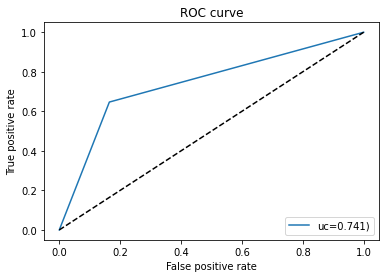

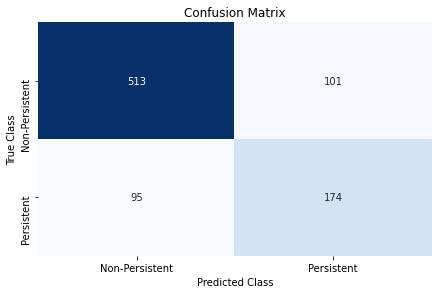

In [81]:
Ridge(X_train,X_test,y_train,y_test)

### SGDClassifier

Accuracy : 0.7927519818799547
Precision : 0.6919642857142857
Recall : 0.5762081784386617
F1 Score : 0.6288032454361054
                precision    recall  f1-score   support

Non-Persistent       0.83      0.89      0.86       614
    Persistent       0.69      0.58      0.63       269

      accuracy                           0.79       883
     macro avg       0.76      0.73      0.74       883
  weighted avg       0.79      0.79      0.79       883

AUC : 0.7319151641378976


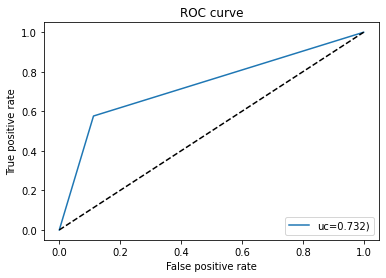

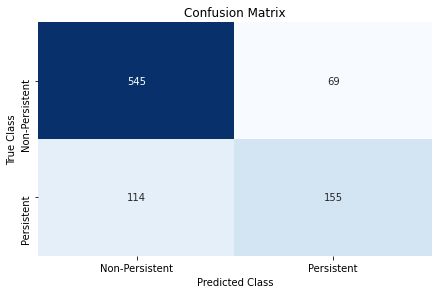

In [82]:
SGD(X_train,X_test,y_train,y_test)

## **Ensemble and Boosting Models**

### RandomForestClassifier

Accuracy : 0.7893544733861835
Precision : 0.7128205128205128
Recall : 0.516728624535316
F1 Score : 0.5991379310344827
                precision    recall  f1-score   support

Non-Persistent       0.81      0.91      0.86       614
    Persistent       0.71      0.52      0.60       269

      accuracy                           0.79       883
     macro avg       0.76      0.71      0.73       883
  weighted avg       0.78      0.79      0.78       883

AUC : 0.7127617064044658


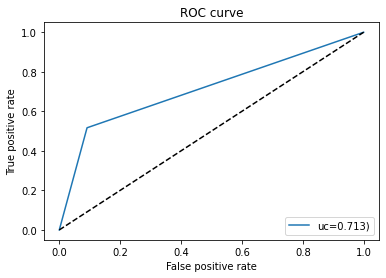

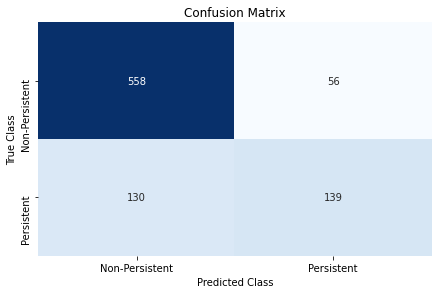

In [83]:
RF(X_train,X_test,y_train,y_test)

### BaggingClassifier

Accuracy : 0.7950169875424689
Precision : 0.6654135338345865
Recall : 0.6579925650557621
F1 Score : 0.6616822429906541
                precision    recall  f1-score   support

Non-Persistent       0.85      0.86      0.85       614
    Persistent       0.67      0.66      0.66       269

      accuracy                           0.80       883
     macro avg       0.76      0.76      0.76       883
  weighted avg       0.79      0.80      0.79       883

AUC : 0.7565207124953077


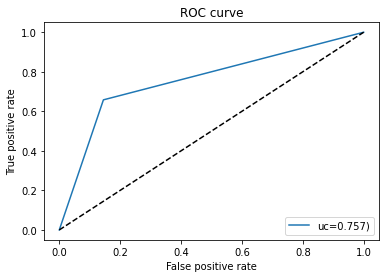

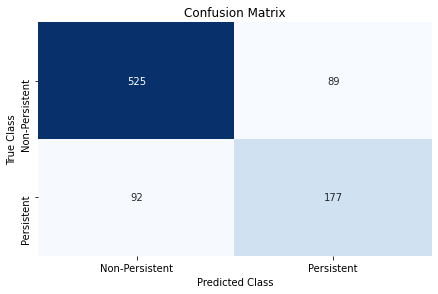

In [84]:
Bagging(X_train,X_test,y_train,y_test)

### AdaBoostClassifier

Accuracy : 0.7802944507361268
Precision : 0.6237623762376238
Recall : 0.7026022304832714
F1 Score : 0.6608391608391608
                precision    recall  f1-score   support

Non-Persistent       0.86      0.81      0.84       614
    Persistent       0.62      0.70      0.66       269

      accuracy                           0.78       883
     macro avg       0.74      0.76      0.75       883
  weighted avg       0.79      0.78      0.78       883

AUC : 0.7584672390201372


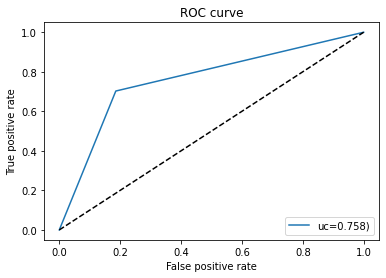

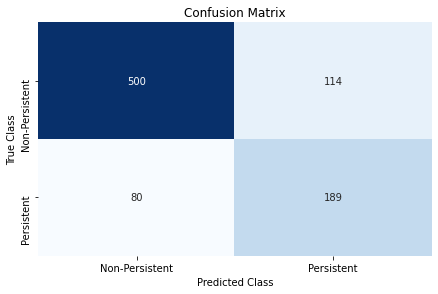

In [85]:
AdaBoost(X_train,X_test,y_train,y_test)

### ExtraTreesClassifier

Accuracy : 0.7882219705549264
Precision : 0.7887323943661971
Recall : 0.4163568773234201
F1 Score : 0.5450121654501217
                precision    recall  f1-score   support

Non-Persistent       0.79      0.95      0.86       614
    Persistent       0.79      0.42      0.55       269

      accuracy                           0.79       883
     macro avg       0.79      0.68      0.70       883
  weighted avg       0.79      0.79      0.77       883

AUC : 0.6837484712349999


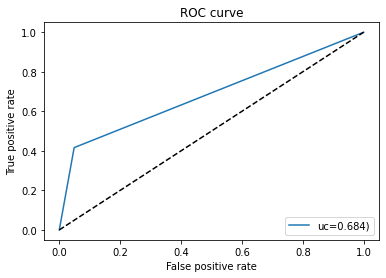

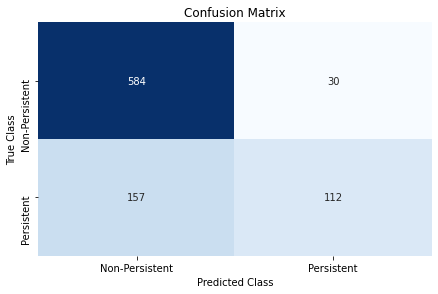

In [86]:
ExtraTrees(X_train,X_test,y_train,y_test)

### GradientBoostingClassifier

Accuracy : 0.7383918459796149
Precision : 0.5725190839694656
Recall : 0.5576208178438662
F1 Score : 0.5649717514124294
                precision    recall  f1-score   support

Non-Persistent       0.81      0.82      0.81       614
    Persistent       0.57      0.56      0.56       269

      accuracy                           0.74       883
     macro avg       0.69      0.69      0.69       883
  weighted avg       0.74      0.74      0.74       883

AUC : 0.6876051971955488


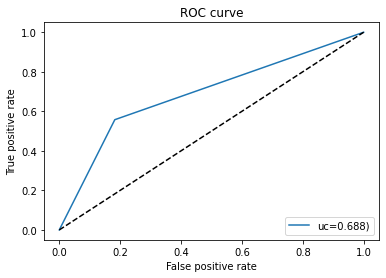

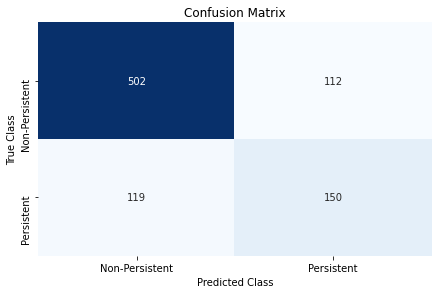

In [94]:
GradientBoosting(X_train,X_test,y_train,y_test)

### StackingClassifier

Accuracy : 0.8029445073612684
Precision : 0.7624309392265194
Recall : 0.5130111524163569
F1 Score : 0.6133333333333333
                precision    recall  f1-score   support

Non-Persistent       0.81      0.93      0.87       614
    Persistent       0.76      0.51      0.61       269

      accuracy                           0.80       883
     macro avg       0.79      0.72      0.74       883
  weighted avg       0.80      0.80      0.79       883

AUC : 0.7214892895632273


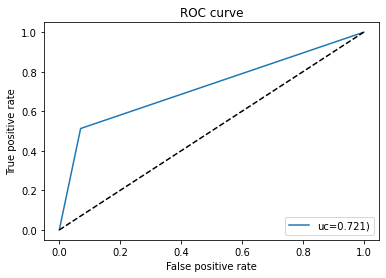

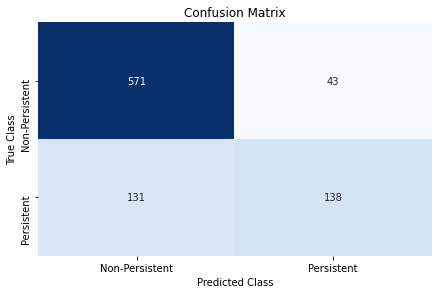

In [95]:
Stacking(X_train,X_test,y_train,y_test)

### XGBoostClassifier

Accuracy : 0.7734994337485843
Precision : 0.648068669527897
Recall : 0.5613382899628253
F1 Score : 0.601593625498008
                precision    recall  f1-score   support

Non-Persistent       0.82      0.87      0.84       614
    Persistent       0.65      0.56      0.60       269

      accuracy                           0.77       883
     macro avg       0.73      0.71      0.72       883
  weighted avg       0.77      0.77      0.77       883

AUC : 0.7138939006817384


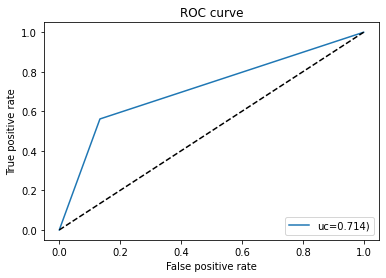

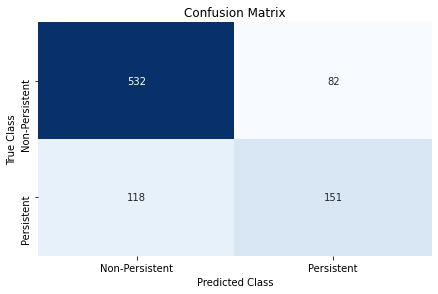

In [96]:
XGBOOST(X_train.values,X_test.values,y_train,y_test)

# **Neural Network**

## Multi Layer Perceptron

Accuracy : 0.7587768969422424
Precision : 0.6129032258064516
Recall : 0.5650557620817844
F1 Score : 0.5880077369439072
                precision    recall  f1-score   support

Non-Persistent       0.82      0.84      0.83       614
    Persistent       0.61      0.57      0.59       269

      accuracy                           0.76       883
     macro avg       0.71      0.70      0.71       883
  weighted avg       0.75      0.76      0.76       883

AUC : 0.70435198527542


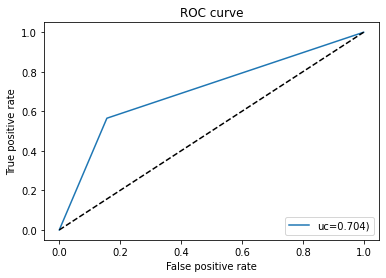

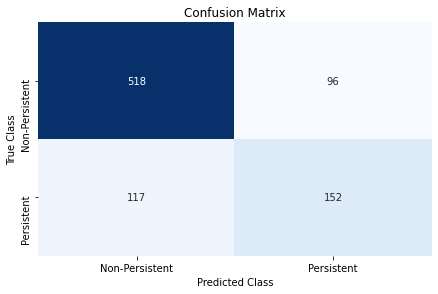

In [97]:
MLP(X_train,X_test,y_train,y_test)

## Multilayer Neural Network with Tensorflow/Keras

Epoch 1/150
230/230 [==============================] - 1s 6ms/step - loss: 0.6947 - accuracy: 0.4751 - val_loss: 0.6706 - val_accuracy: 0.9477
Epoch 2/150
230/230 [==============================] - 1s 4ms/step - loss: 0.6865 - accuracy: 0.5633 - val_loss: 0.6930 - val_accuracy: 0.5348
Epoch 3/150
230/230 [==============================] - 1s 4ms/step - loss: 0.6739 - accuracy: 0.6488 - val_loss: 0.7229 - val_accuracy: 0.3571
Epoch 4/150
230/230 [==============================] - 1s 4ms/step - loss: 0.6589 - accuracy: 0.6728 - val_loss: 0.7525 - val_accuracy: 0.3293
Epoch 5/150
230/230 [==============================] - 1s 4ms/step - loss: 0.6354 - accuracy: 0.7003 - val_loss: 0.7899 - val_accuracy: 0.3972
Epoch 6/150
230/230 [==============================] - 1s 4ms/step - loss: 0.6152 - accuracy: 0.6981 - val_loss: 0.7931 - val_accuracy: 0.4425
Epoch 7/150
230/230 [==============================] - 1s 4ms/step - loss: 0.6000 - accuracy: 0.7086 - val_loss: 0.7969 - val_accuracy: 0.4774

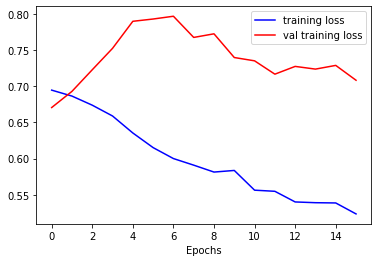

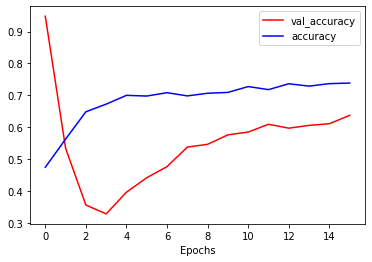

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
Accuracy : 0.7814269535673839
Precision : 0.6696428571428571
Recall : 0.5576208178438662
F1 Score : 0.6085192697768763
                precision    recall  f1-score   support

Non-Persistent       0.82      0.88      0.85       614
    Persistent       0.67      0.56      0.61       269

      accuracy                           0.78       883
     macro avg       0.74      0.72      0.73       883
  weighted avg       0.77      0.78      0.78       883

AUC : 0.7185498226027148


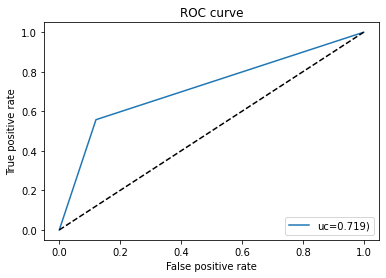

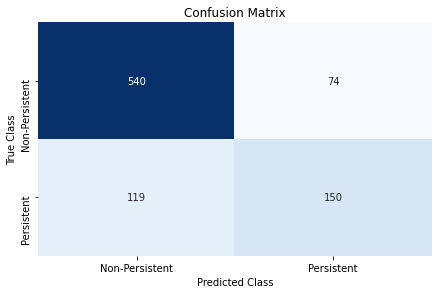

In [98]:
MNN(X_train,X_test,y_train,y_test)

# Conclusion

Approximately all the classifiers have same result, but three of them are the bests and their result are so close to each other:


*   RidgeClassifier (Linear)
*   AdaBoostClassifier (Ensemble/Boosting)
*   XGBoostClassifier (Ensemble/Boosting)

They have aroun 81% Accuracy, 68% Precision, 71% Recall, 70% F1 Score, 78% AUC.
We can also see the results for each classifier as well.



## Training the final model

In [100]:
###Stacking classifier
import pickle
estimators = [('rf', RandomForestClassifier(n_estimators=10, random_state=42)), ('svr', make_pipeline(StandardScaler(), LinearSVC(random_state=42)))]
final_model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
final_model.fit(X, y)
filename = 'final_model.sav'
pickle.dump(final_model, open(filename, 'wb'))

StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(n_estimators=10,
                                                       random_state=42)),
                               ('svr',
                                Pipeline(steps=[('standardscaler',
                                                 StandardScaler()),
                                                ('linearsvc',
                                                 LinearSVC(random_state=42))]))],
                   final_estimator=LogisticRegression())